# Project 1

#### Welcome to the world of Linear of Transformations. 
In this project we expect you experience and appreciate for yourself how powerful matrix algera is in handling large(HUGE) quantities of data with very little task or computation overhead! 

Lets first start with a simple example of a square, collection of four points, in a given Frame (A frame is just a defined origin and a basis or what we call axis). Lets define a structure to represent that and also plot it in the next couple cells that you should run as it is.  


In [1]:
using Plots
default(fmt = :png)

mutable struct my_Frame 
    origin ::Array{Float64}
    x_point ::Array{Float64}
    y_point ::Array{Float64}
end

In [2]:
@recipe function t(mt::my_Frame)
    seriestype := :quiver;
    aspect_ratio := 1;
    v = [(mt.y_point[2]-mt.origin[2]) (mt.y_point[1]-mt.origin[1]); (mt.x_point[2]-mt.origin[2]) (mt.x_point[1]-mt.origin[1])];
    quiver := (1.5*v[1,:],1.5*v[2,:]);  
    seriescolor := [:blue,:red];
    [mt.origin[1],mt.origin[2]],[mt.origin[1],mt.origin[2]]
end

## Task 1 

Now setting you up for our first task, we have defined a Frame and a set of points in that Frame that form a square when plotted correctly. When you run the next block of code, you should see the figure given in the pdf.  

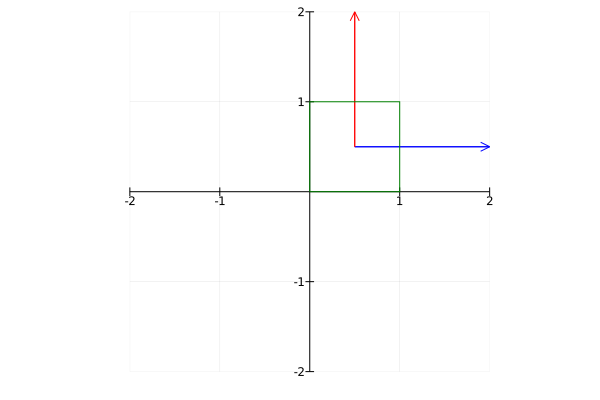

In [3]:
Plots.plot()
frame = my_Frame([0.5,0.5],[1.5,0.5],[0.5,1.5]);
plot!(frame)

points = [0 0; 0 1;1 1; 1 0; 0 0]';
x = points[1,:];
y = points[2,:];
Plots.plot!(x,y, xlims = (-2,2), ylims = (-2,2), grid = true, framestyle = :origin, legend = false, seriescolor = :green)

### Part A

#### Translation
Shift each point by -0.5 in x and y and center our square around the origin. We also tranform your Frame (a collection of three points (x,y). Accessed as frame.origin, frame.x_point, frame.y_point. Once we shift these points we create a new frame by calling the constructor and passing the shifted points as arguments. Finally we plot the new frame.
As for your task, apply a similar shifting operation to your points vector that forms the square. Mathematically this operation can be written as:

Lets define x',y' as tranformed points and x,y are your points in our Frame. Thus, from our transformation we can say x' = x-0.5, and y' = y-0.5;

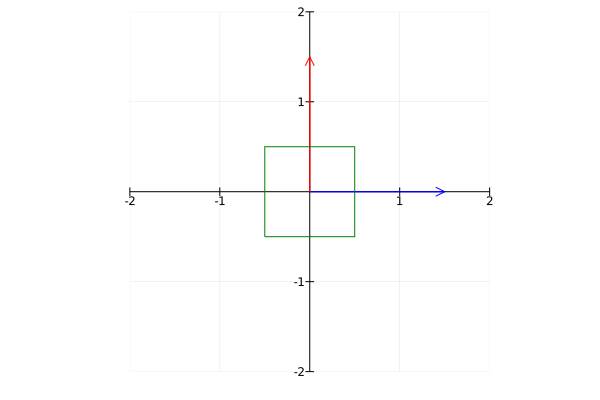

In [4]:
# Shift the points that define the Frame 
shift_vector = [0.5;0.5];
transformed_frame = my_Frame(frame.origin-shift_vector,frame.x_point-shift_vector,frame.y_point-shift_vector)

Plots.plot()
plot!(transformed_frame)

# Save the shifted points in an array called transformed_points

# BEGIN SOLUTION
transformed_points = Array{Float64}(undef,2,5);
for i in 1:size(points,2)
    transformed_points[1,i] = points[1,i] - 0.5;
    transformed_points[2,i] = points[2,i] - 0.5;
end
# END SOLUTION
Plots.plot!(transformed_points[1,:],transformed_points[2,:], xlims = (-2,2), ylims = (-2,2), grid = true, framestyle = :origin, legend = false, seriescolor = :green)

### Part B

#### Homogeneous Transformation (Translation)

Let's now vectorize this,

 $\begin{bmatrix} x'\\y' \end{bmatrix} = \begin{bmatrix}x-0.5\\y-0.5\\ \end{bmatrix}$
 
This can also be written as a product of two matrices
 
$\begin{bmatrix} x'\\y'\\1 \end{bmatrix} = \begin{bmatrix}1&0&-0.5\\0&1&-0.5\\0&0&1\\ \end{bmatrix} * \begin{bmatrix}x\\y\\1\\ \end{bmatrix}$

This, is called a homogenous point. And these special transformations are called Homogeneous transformation. The matrix $\begin{bmatrix}1&0&-0.5\\0&1&-0.5\\0&0&1\\ \end{bmatrix}$ is called a Homogeneous Tranformation matrix. 
You will see them EVERYWHERE in this notebook. We will define all transformations in this format from this point forward. 

Thus, any Translation in 2D can be defined as:
 
$\begin{bmatrix} x'\\y'\\1 \end{bmatrix} = \begin{bmatrix}1&0&t_x\\0&1&t_y\\0&0&1\\ \end{bmatrix} * \begin{bmatrix}x\\y\\1\\ \end{bmatrix}$

Lets define a function to first build a homogeneous points array from any given array by appending the ones at after the last row in the array and return the built array, ready to be used in a homogeneoud transformation operation. The autograded cell will make sure that your function is indeed correct, before we move ahead. 

In [5]:
function homogenize(x ::AbstractArray)
    # BEGIN SOLUTION
    new_x = [x;ones(1,size(x,2))];
    return new_x;
    #END SOLUTION
end

display(homogenize(points))

3×5 Array{Float64,2}:
 0.0  0.0  1.0  1.0  0.0
 0.0  1.0  1.0  0.0  0.0
 1.0  1.0  1.0  1.0  1.0

Now that we have an array of Homogenous coordinates, we are ready to Transform them by pre-multiplying them by a an Homogeneous Transformation matrix. Complete the function definitioon that does the same for you. Remember to de-homogenize i.e. drop the last row of ones that we added to our coordinates to return only the transformed points, $\begin{bmatrix} x'\\y' \end{bmatrix}$. Autograded cell will check if what you have is right! 

In [6]:
function Transform(p ::AbstractArray, T ::AbstractArray)
    # Check that matrix sizes are compatible for multiplication
    if(size(T,2)!=size(p,1)+1)
        error("wrong sizes");
        return;
    end
    #BEGIN SOLUTION
    homogenized_p = homogenize(p);
    transformed_p = T*homogenized_p;
    
    # Remember to return the de homogenized array, i.e. transformed_points should have same size as input points 
    return transformed_p[1:size(p,1),1:size(p,2)];
    
    #END SOLUTION
end

Transform (generic function with 1 method)

##### Application

Now lets the define the transformation that we did before, and do in the new way that we just learned. You will need to define a homogeneous Transformation matrix that accomplishes the shifting task that we completed before. We will then use this tranformation to call the Transform function and shift the frame as well the points vector and plot your square once again in the new shifted Frame! 

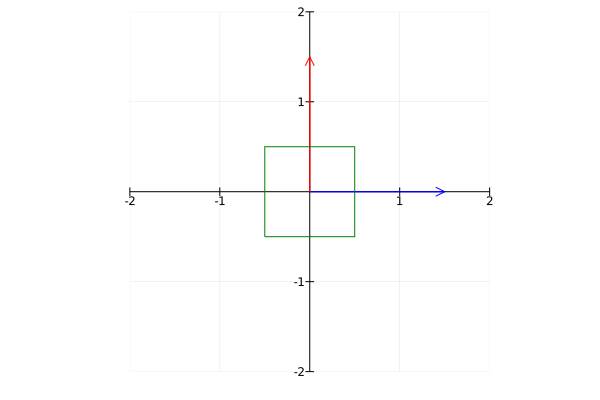

In [7]:
# Save the affine Transformation as T, and finally transform your points by calling your function. 
# BEGIN SOLUTION
T = [1 0 -0.5;0 1 -0.5; 0 0 1];
transformed_points = Transform(points,T);
# END SOLUTION 
transformed_frame = my_Frame(Transform(frame.origin,T),Transform(frame.x_point,T),Transform(frame.y_point,T))
Plots.plot()
plot!(transformed_frame)


Plots.plot!(transformed_points[1,:],transformed_points[2,:], xlims = (-2,2), ylims = (-2,2), grid = true, framestyle = :origin, legend = false, seriescolor = :green)

Next up, 

#### Rotations

We encourage to read up in the pdf about these transformation but the final matrix for a rotation in 2d is given as:

$\begin{bmatrix} x'\\y'\\1 \end{bmatrix} = \begin{bmatrix}\cos{\theta}&-\sin{\theta}&0\\\sin{\theta}&\cos{\theta}&0\\0&0&1\\ \end{bmatrix} * \begin{bmatrix}x\\y\\1\\ \end{bmatrix}$

Lets rotate our square in the x-y plane by 90 degrees or $\pi/4$. Build this Transformation Matrix that we will use to Transform the Frame and the square calling the Transform function that you wrote before. No changes except the Transformation matrix, and see what happens!     

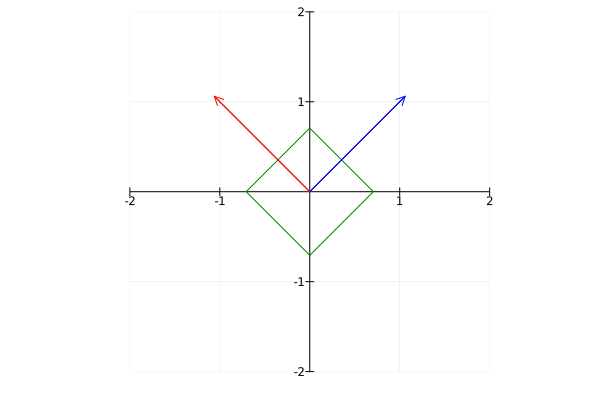

In [8]:
Plots.plot()
# BEGIN SOLUTION
theta = pi/4;
T = [cos(theta) -sin(theta) 0; sin(theta) cos(theta) 0; 0 0 1];
transformed_points = Transform(transformed_points,T);
# END SOLUTION
Plots.plot!(transformed_points[1,:],transformed_points[2,:], xlims = (-2,2), ylims = (-2,2), grid = true, framestyle = :origin, legend = false, seriescolor = :green)
transformed_frame = my_Frame(Transform(transformed_frame.origin,T),Transform(transformed_frame.x_point,T),Transform(transformed_frame.y_point,T))
plot!(transformed_frame)


#### Scaling
We encourage you to read up in the pdf about these transformation but the final matrix for a scaling operation in 2d is given as:

$\begin{bmatrix} x'\\y'\\1 \end{bmatrix} = \begin{bmatrix}S_x&0&0\\0&S_y&0\\0&0&1\\ \end{bmatrix} * \begin{bmatrix}x\\y\\1\\ \end{bmatrix}$


Lets scale our transformed square with $S_x = 1.5 S_y = 0.5$

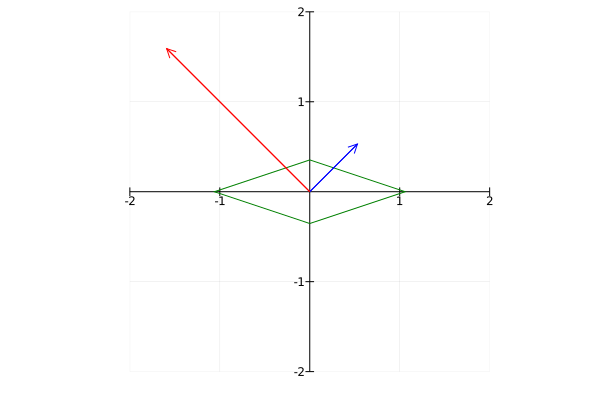

In [9]:
Plots.plot()
# BEGIN SOLUTION
sx = 1.5;
sy = 0.5;
T = [sx 0 0;0 sy 0; 0 0 1];
transformed_points = Transform(transformed_points,T);
# END SOLUTION
Plots.plot!(transformed_points[1,:],transformed_points[2,:], xlims = (-2,2), ylims = (-2,2), grid = true, framestyle = :origin, legend = false, seriescolor = :green)
transformed_frame = my_Frame(Transform(transformed_frame.origin,T),Transform(transformed_frame.x_point,T),Transform(transformed_frame.y_point,T))
plot!(transformed_frame)

## Affine Transformations 

## Part C

All these transformations and even combinations of them are called Affine Transformations
You will see that keeping track all your points during the transformation becomes cumbersome over time. But, here is the catch with using Affine Transformation. Because we multiply our transformation to our points, we are liberty to premultiply these Transformations in order of application to obtain a composite Transformation and finally apply that to our original point and just plot it once and for all! 
Lets do that for our problem here. 

$T = \begin{bmatrix}1.5&0&0\\0&0.5&0\\0&0&1\\ \end{bmatrix} * \begin{bmatrix}\cos(\pi/4)&-\sin(\pi/4)&0\\\sin(\pi/4)&\cos(\pi/4)&0\\0&0&1\\ \end{bmatrix} * \begin{bmatrix}1&0&-0.5\\0&1&-0.5\\0&0&1\\ \end{bmatrix}$

No need to do it by hand, Julia will do the multiplication for you! 

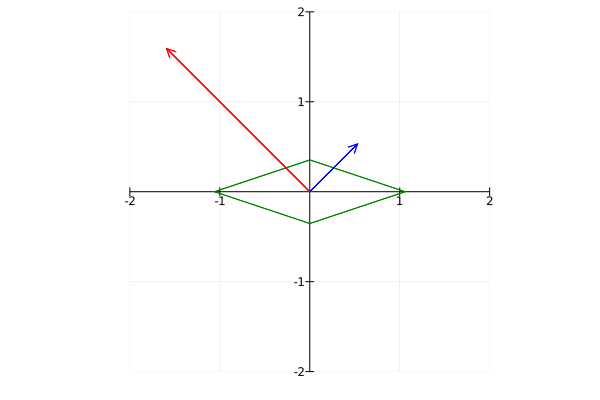

In [10]:
# BEGIN SOLUTION
T = [sx 0 0;0 sy 0; 0 0 1]*[cos(theta) -sin(theta) 0; sin(theta) cos(theta) 0; 0 0 1]*[1 0 -0.5;0 1 -0.5; 0 0 1];
transformed_points = Transform(points,T);
# END SOLUTION
Plots.plot!(transformed_points[1,:],transformed_points[2,:], xlims = (-2,2), ylims = (-2,2), grid = true, framestyle = :origin, legend = false, seriescolor = :green)
transformed_frame = my_Frame(Transform(frame.origin,T),Transform(frame.x_point,T),Transform(frame.y_point,T))
plot!(transformed_frame)

# Task 2

Before we move on to 3D Pointclouds. Let's start with a simpler problem, lets see if you can figure out the text in the image says and bring the logo at your origin like shown in the image in the PDF!
Lets first read the contents of the file "question_image.csv" into an array (use the function read_pointcloud_2D), and plot the points in a scatter plot, completed for you.

Run the following blocks for building the structure, the parser function and the recipe for plotting your structure. You should not make any changes the code in here. 

In [11]:
using DelimitedFiles


mutable struct Pointcloud_2D
    pointcloud ::Array{Float64}
    Transformation ::Array{Float64}
end

T = [1 0 0;0 1 0;0 0 1];
Pointcloud_2D(a ::Array{Float64}) = Pointcloud_2D(a ::Array{Float64},T)

Pointcloud_2D

In [12]:
# Parses the data for you and return and object, give the filename as an argument when calling
function read_pointcloud_2D(filename::String)
    pointcloud = readdlm(filename,',');
    my_cloud = Pointcloud_2D(pointcloud);
    return my_cloud
end

read_pointcloud_2D (generic function with 1 method)

In [13]:
# Defines the attributes for a scatter plot 
@recipe function f(mt::Pointcloud_2D)
    seriestype:=scatter
    markersize := 0.8;
    markerstrokewidth := 0;
    dpi :=600
    seriescolor := :blue
    legend := false;
    mt.pointcloud[1,:],mt.pointcloud[2,:]
end

# Use as:
# plot($name_of_your_object)

Now for your Task, simply read the poincloud and plot it by calling the functions discussed before. read comments to see example usage of code if you are stuck.

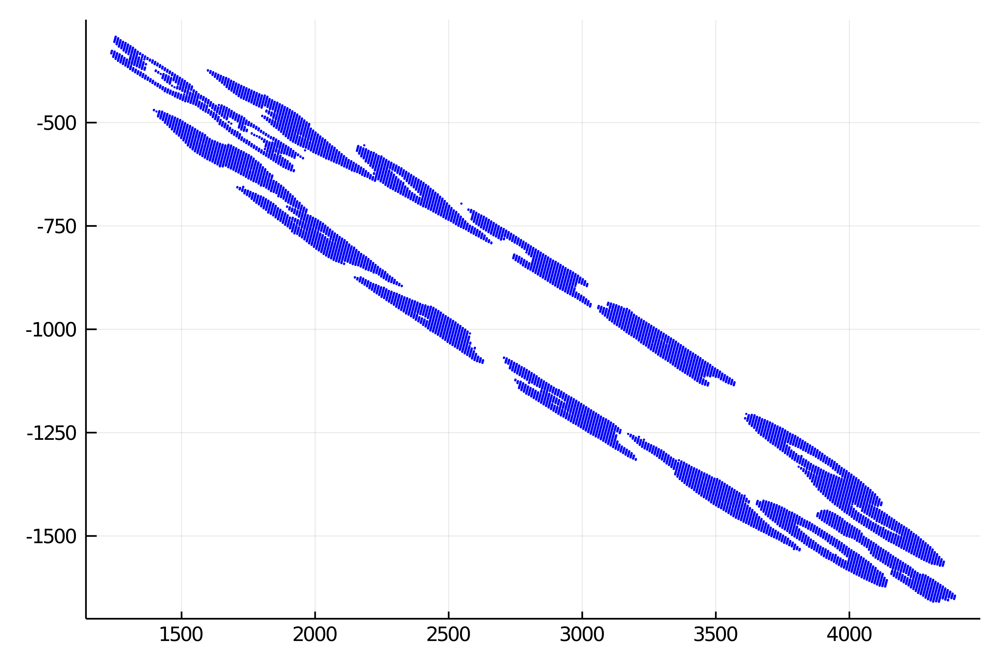

In [14]:
# Example calls to parsing data and plotting it 

my_pointcloud = read_pointcloud_2D("data/question_image.csv");

plot(my_pointcloud)


Lets center this text in the center so we can read what the logo says properly, and check if your guess is right!
The Homogeneous Transformation for this task is given to you as:

$ T = \begin{bmatrix}-0.09239&0.038268&300\\-0.38268&-0.923879&165\\0&0&1\\ \end{bmatrix}$
      
Call the pre-defined Transform function and finally plot your 2D Pointcloud! You should save the Tranformation inside the pointcloud structure (just a good coding practice!). 

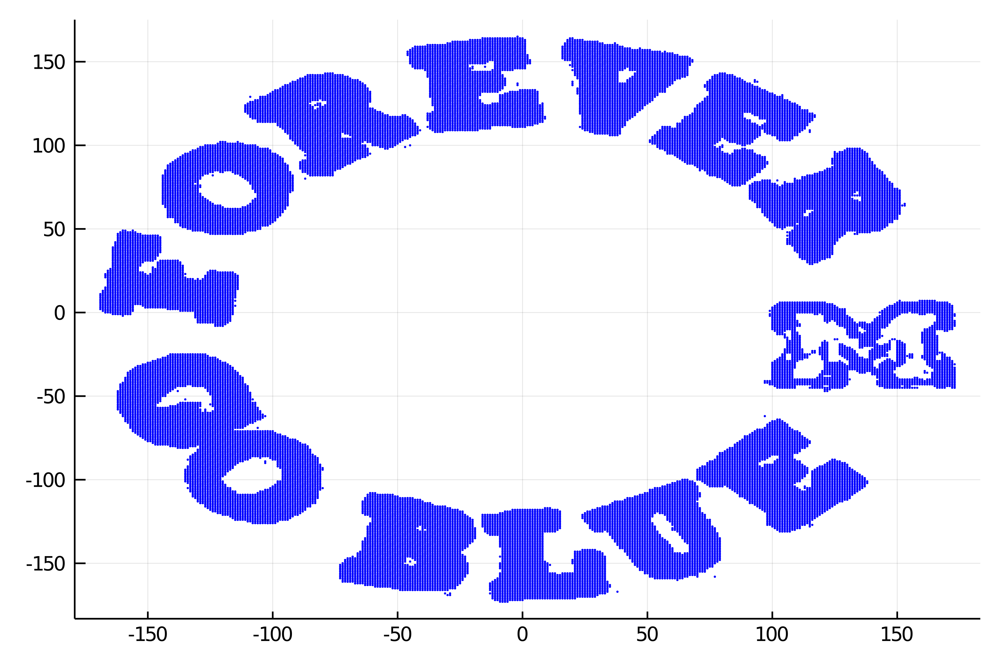

In [15]:
#BEGIN SOLUTION

# Build a Transformation Matrix 

my_pointcloud.Transformation = [-0.09239 0.038268 300; -0.38268 -0.923879 165; 0 0 1];

# Transform 2D points!

result = Transform(my_pointcloud.pointcloud,my_pointcloud.Transformation);
transformed_pointcloud = Pointcloud_2D(result)

# Plotting!

plot(transformed_pointcloud)

#END SOLUTION

# Task 3

Now that we have seen the power of Tranformations in 2D lets move on to a more challenging case of 3-D. We won't have you worry about the plotting in this case, a plotting functionality is written down for you! 

Your Task is to plot the raw Pointcloud data as obtained from a single LiDAR, along with the position of the robot that was read was estimated from the IMU data (details in the pdf). You should observe that the pointcloud does not look consistent with our position estimate. This is expected because we are seeing the points in the frame of the robot position and the position itself is estimated in the world frame. For the two to be consistent they should be in the same frame or the world frame to make any sense! 
Use the plot!() to plot everything in the same plot. 
This is one of the blunders we can make as engineers, not transforming everything in a consistent manner can lead to major and hard to identify mistakes in our experiments!
Run the next couple of blocks to get the structure for a pointcloud and data parser function and plotting recipes. 

In [16]:
mutable struct Pointcloud_3D
    pointcloud ::Array{Float64}
    Intensity ::Array{Float64}
    R ::Array{Float64}
    T ::Array{Float64}
end

R = [1 0 0;0 1 0;0 0 1];
T = [0;0;1]
Pointcloud_3D(a ::Array{Float64}) = Pointcloud_3D(a[1:3,:] ::Array{Float64}, a[4,:] ::Array{Float64},R,T)

mutable struct Position
    position ::Array{Float64}
    orientation ::Array{Float64}
end


In [17]:
# Run this Block for plotting functionality 

function rescale(vector)
    m = size(vector)[1]
    new_vector = randn(m,1)
    xmin = minimum(vector);
    xmax = maximum(vector);
    for jj = 1:m
      new_vector[jj] = (vector[jj] - xmin) / (xmax-xmin);
    end
    return new_vector
end

C(g::ColorGradient) = RGB[g[z] for z in range(0,length = 1, step  = 0.001)];
g = :rainbow;

In [18]:
# This funtion parses the pointcloud and transformation data for your from the Frame architechture, just pass the Frame number
# and the PointCloud Number to get  Pointcloud_3D object. An example call for the function looks like:
# read_pointcloud_3D(30,20)

function read_pointcloud_3D(frame_id::Integer)
    points = readdlm(string("data/cassei_data/Frame_",string(frame_id),"/pointcloud.csv"),',');
    points[4,:] = rescale(points[4,:]);
    Transformations = readdlm(string("data/cassei_data/Frame_",string(frame_id),"/Transformations.csv"),',');
    R = Transformations[:,1:3];
    T = Transformations[:,4];
    my_cloud = Pointcloud_3D(points[1:3,:],points[4,:],R,T);
    return my_cloud;
end

function read_position(frame_id::Integer)
    position = readdlm(string("data/cassei_data/Frame_",string(frame_id),"/Position.csv"),',');
    my_position = Position(position[:,1],position[:,2]);
    return my_position;
end

# This funtion parses the Position data for your from the Frame architechture, just pass the Frame number
# and the Position object. An example call for the function looks like:
# read_position(30)

read_position (generic function with 1 method)

In [19]:
# Sample call for a Pointcloud_3D obejct using this recipe will look like:
# plot!($your_object,1)      For Task 1
# plot ($your_object)        Otherwise
@recipe function g(mt::Pointcloud_3D, plottype::Integer = 2)
    flipx = false;
    flipz = false;
    flipy = false;
    window_size = 15
    min_x = -window_size;
    min_y = -window_size;
    max_y = window_size;
    min_z = 0;
    max_z = 2*window_size;
    max_x = window_size;
    seriestype := :scatter3d
    if(plottype == 1)
        markersize := 0.1;
        dpi :=1080;
        camera := (0,90);
    else
        markersize := 0.1;
        camera := (90,45);
        dpi :=1080;
    end
    markercolor := cgrad(g, rev = true)
    marker_z := mt.Intensity;
    aspect_ratio :=1;
    background_color:= :black;
    foreground_color := :black;
    legend :=false;
    zlims :=(min_z,max_z);
    ylims :=(min_y,max_y);
    xlims :=(min_x,max_x);
    mt.pointcloud[1,:],mt.pointcloud[2,:],mt.pointcloud[3,:]
end

@recipe function p(mt::Position, plottype::Integer = 2)
    pos = mt.position;
    (roll,pitch,yaw) = mt.orientation;
    u = [1*cos(yaw)cos(pitch)]
    v = [1*sin(yaw)cos(pitch)]
    w = [1*sin(pitch)]
    
    if(plottype == 1)
        seriestype := :quiver
        quiver := (u,v,w)
        projection := "3d";
        arrow :=(10,10);
    else
        seriestype := :scatter3d;
        markersize := 2;
    end
    seriescolor --> :white;
    pos[1,:],pos[2,:],pos[3,:]
end

# Sample call for a Position obejct using this recipe will look like:
# plot!($your_object,1)      For Task 1
# plot ($your_object)        Otherwise

### Part A
For the first part, lets read the raw pointcloud in the last LiDAR Frame (Frame 30) using the read_pointcloud_3D function and passing the frame number as an argument. Also, read the position and plot it in the same plot. 

Also pass an extra argument while calling the plot functions for this problme to plot in 2D, so we can see how the position compares with the LiDAR raw pointcloud. We expect it to be coincentric circles around our position estimate. Let see what it looks like!

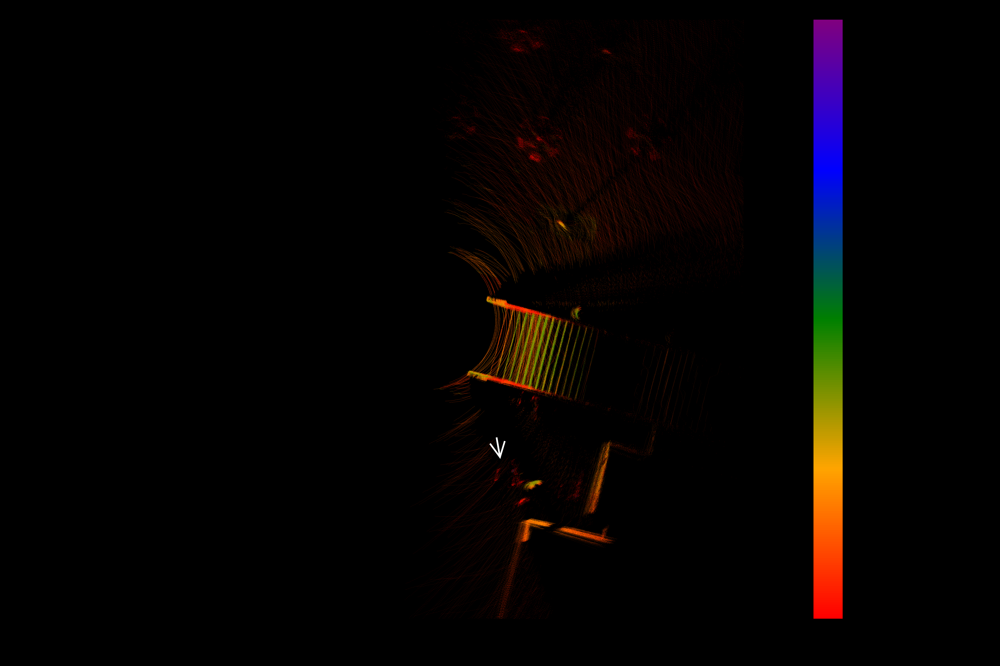

In [20]:
# Part A


Plots.plot();
# select the First PointCloud in the Last Frame (30) and read the data into a vector, like we did our 3D, you might need some string concatenation!

# BEGIN SOLUTION

frame_id = 30;
# Rescaling intensity 

my_pointcloud = read_pointcloud_3D(frame_id);
# Read Position data

my_position = read_position(frame_id)    

# Plotting your result!
Plots.plot!(my_pointcloud,1)
Plots.plot!(my_position,1)

# END SOLUTION



#### Transform

Time to correct our blunder now! Transform the point cloud into the world frame and plot it with the position arrow as we did before and compare the two plots. You will have to build an affine transformation matrix from the Rotation and Translation matrix given to you.
We know that an affine transformation can be represented as: \begin{bmatrix}\ & & & \\ &R& &T \\ & & & \\0&0&0&1\\ \end{bmatrix} 
Do you see coincentric circles of LiDAR originating from our position estimate?!

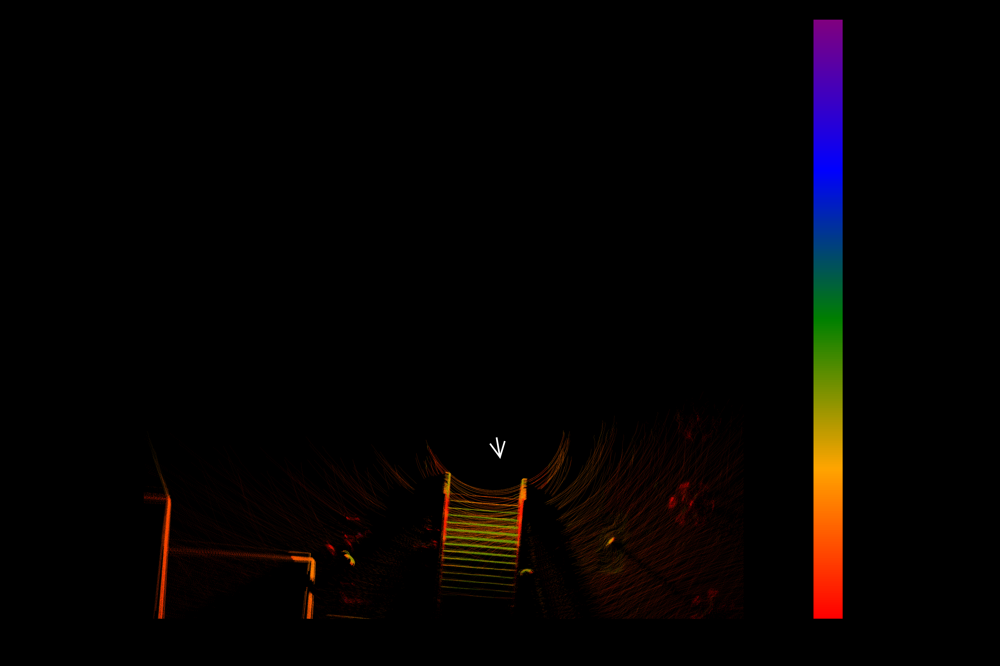

In [21]:

Plots.plot()

#BEGIN SOLUTION

# Build the Transformation matrix for the first point cloud for the Frame, reading the first four columns of the Transformations.csv file

affine = [my_pointcloud.R my_pointcloud.T;0 0 0 1];

# Don't forget to Homogenize your points, and finally apply the transformation

my_pointcloud.pointcloud = Transform(my_pointcloud.pointcloud,affine);

Plots.plot!(my_pointcloud,1)
Plots.plot!(my_position,1)

# END SOLUTION


### Part B

#### BUILDING A MAP and fusing different LiDAR scans!

Now that we understand how to go from a LiDAR to a world frame. Let us start to try to build a map. As you will notice from the figure, a single LiDAR scan is not enough to give us full scene understanding and we need to fuse multiple scans together for a more vivid picture. 
However as the robot is continuously moving the transformation from the present LiDAR to the world frame also keeps changing. 
Thus, we have given you the transformation data from each consecutive LiDAR frame to the world frame. 
Iterate over all Frames of data (30) and plot the LiDAR scans to get a map of the stairway outside the DOW Building! 

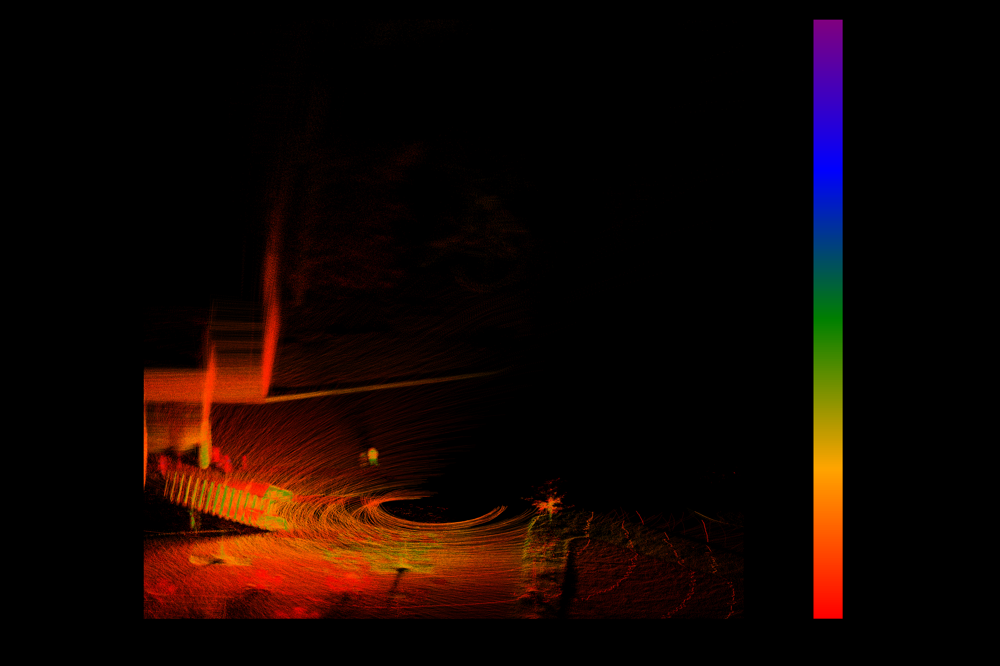

┌ Warning: Multiple series with different color share a colorbar. Colorbar may not reflect all series correctly.
└ @ Plots /home/trippy/.juliapro/JuliaPro_v1.4.2-1/packages/Plots/3INZP/src/backends/gr.jl:491


In [22]:
# Part B

Plots.plot()

#BEGIN SOLUTION

# Iterate over all the other clouds, and apply the transformation and plot in the same plot

for i = 1:30
    my_pointcloud = read_pointcloud_3D(i);
    affine = [my_pointcloud.R my_pointcloud.T;0 0 0 1];
    my_pointcloud.pointcloud = Transform(my_pointcloud.pointcloud, affine);
    Plots.plot!(my_pointcloud)
end

# END SOLUTION
display(plot!())


### Lets Make a video

Amazing, so now you have built a map of the staircase in our video!
Next step is simply iterating over all these frame and making a gif and see it build that map in real time. Just cope your code from the previous question inside the loop iterating over all frames to build gif. And this time also, we will add the position of the robot in the animation. 

20

21

22

┌ Warning: Multiple series with different color share a colorbar. Colorbar may not reflect all series correctly.
└ @ Plots /home/trippy/.juliapro/JuliaPro_v1.4.2-1/packages/Plots/3INZP/src/backends/gr.jl:491
┌ Warning: Multiple series with different color share a colorbar. Colorbar may not reflect all series correctly.
└ @ Plots /home/trippy/.juliapro/JuliaPro_v1.4.2-1/packages/Plots/3INZP/src/backends/gr.jl:491


23

24

┌ Warning: Multiple series with different color share a colorbar. Colorbar may not reflect all series correctly.
└ @ Plots /home/trippy/.juliapro/JuliaPro_v1.4.2-1/packages/Plots/3INZP/src/backends/gr.jl:491
┌ Warning: Multiple series with different color share a colorbar. Colorbar may not reflect all series correctly.
└ @ Plots /home/trippy/.juliapro/JuliaPro_v1.4.2-1/packages/Plots/3INZP/src/backends/gr.jl:491


25

26

┌ Warning: Multiple series with different color share a colorbar. Colorbar may not reflect all series correctly.
└ @ Plots /home/trippy/.juliapro/JuliaPro_v1.4.2-1/packages/Plots/3INZP/src/backends/gr.jl:491
┌ Warning: Multiple series with different color share a colorbar. Colorbar may not reflect all series correctly.
└ @ Plots /home/trippy/.juliapro/JuliaPro_v1.4.2-1/packages/Plots/3INZP/src/backends/gr.jl:491


27

28

┌ Warning: Multiple series with different color share a colorbar. Colorbar may not reflect all series correctly.
└ @ Plots /home/trippy/.juliapro/JuliaPro_v1.4.2-1/packages/Plots/3INZP/src/backends/gr.jl:491
┌ Warning: Multiple series with different color share a colorbar. Colorbar may not reflect all series correctly.
└ @ Plots /home/trippy/.juliapro/JuliaPro_v1.4.2-1/packages/Plots/3INZP/src/backends/gr.jl:491


29

30

┌ Warning: Multiple series with different color share a colorbar. Colorbar may not reflect all series correctly.
└ @ Plots /home/trippy/.juliapro/JuliaPro_v1.4.2-1/packages/Plots/3INZP/src/backends/gr.jl:491
┌ Warning: Multiple series with different color share a colorbar. Colorbar may not reflect all series correctly.
└ @ Plots /home/trippy/.juliapro/JuliaPro_v1.4.2-1/packages/Plots/3INZP/src/backends/gr.jl:491


making the gif!!

┌ Info: Saved animation to 
│   fn = /home/trippy/ROB101/Project_1/stairs_walking_five_seconds_zoomed_thirty.gif
└ @ Plots /home/trippy/.juliapro/JuliaPro_v1.4.2-1/packages/Plots/3INZP/src/animation.jl:104


Plots.AnimatedGif("/home/trippy/ROB101/Project_1/stairs_walking_five_seconds_zoomed_thirty.gif")
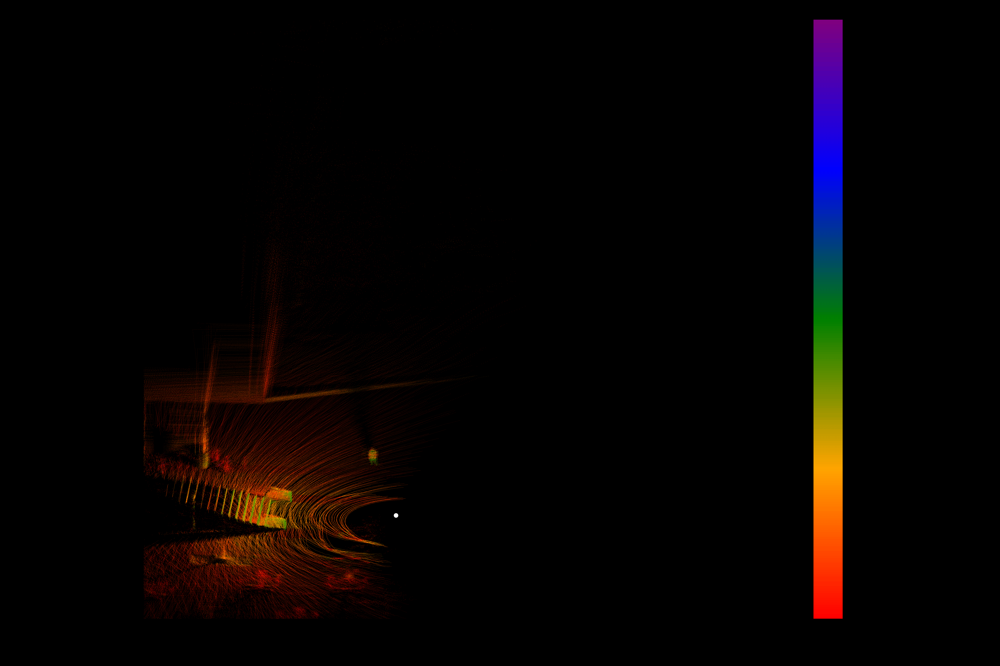

In [23]:
Total_Frames = 30
Plots.plot()
# Build an animation!
start_index = 20;
prev_position = read_pointcloud_3D(start_index);
anim = @animate for i = start_index:Total_Frames
    my_position = read_position(i);
    Plots.plot!(my_position);
    
    # COPY YOUR CODE HERE
    
    my_pointcloud = read_pointcloud_3D(i);
    affine = [my_pointcloud.R my_pointcloud.T;0 0 0 1];
    my_pointcloud.pointcloud = Transform(my_pointcloud.pointcloud,affine);
    Plots.plot!(my_pointcloud);
    
    # END SOLUTION
    
    if(i!=start_index)
        prev_position = read_position(i-1);
        Plots.plot!(prev_position, seriescolor = :black)    
    end
    display(i);
end
print("making the gif!!")
gif(anim, "stairs_walking_five_seconds_zoomed_thirty.gif", fps = 1)